In [25]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
from torch.utils.tensorboard import SummaryWriter  # to print to tensorboard
from google.colab import files

In [26]:
class Discriminator(nn.Module):
    def __init__(self, in_features):
        super().__init__()
        self.disc = nn.Sequential(
            nn.Linear(in_features, 128),
            nn.LeakyReLU(0.01),
            nn.Linear(128, 1),
            nn.Sigmoid(),
        )
    def forward(self, x):
        return self.disc(x)

# Define Generator class
class Generator(nn.Module):
    def __init__(self, z_dim, img_dim):
        super().__init__()
        self.gen = nn.Sequential(
            nn.Linear(z_dim, 256),
            nn.LeakyReLU(0.01),
            nn.Linear(256, img_dim),
            nn.Tanh(),
        )
    def forward(self, x):
        return self.gen(x)


In [27]:
device = "cuda" if torch.cuda.is_available() else "cpu"
lr = 3e-4
z_dim = 64
image_dim = 28 * 28 * 1  # 784
batch_size = 32
num_epochs = 50

# Initialize models
disc = Discriminator(image_dim).to(device)
gen = Generator(z_dim, image_dim).to(device)
fixed_noise = torch.randn((batch_size, z_dim)).to(device)

# Data transformations and loading
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataset = datasets.MNIST(root="./data", transform=transform, download=True)
loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

# Optimizers and loss function
opt_disc = optim.Adam(disc.parameters(), lr=lr)
opt_gen = optim.Adam(gen.parameters(), lr=lr)
criterion = nn.BCELoss()

Epoch [1/50] Loss D: 0.7505, Loss G: 0.8862


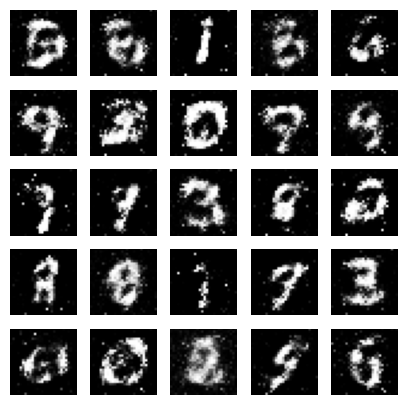

Epoch [2/50] Loss D: 0.6685, Loss G: 1.0570


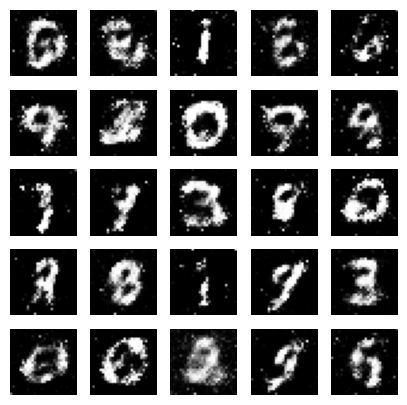

Epoch [3/50] Loss D: 0.6948, Loss G: 0.7753


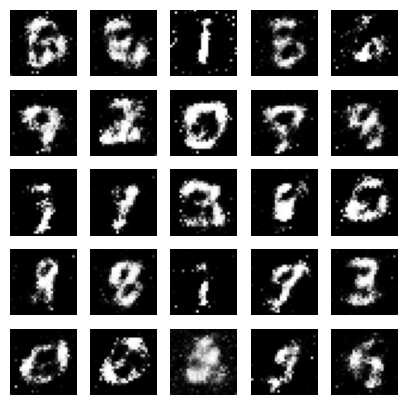

Epoch [4/50] Loss D: 0.4795, Loss G: 1.1926


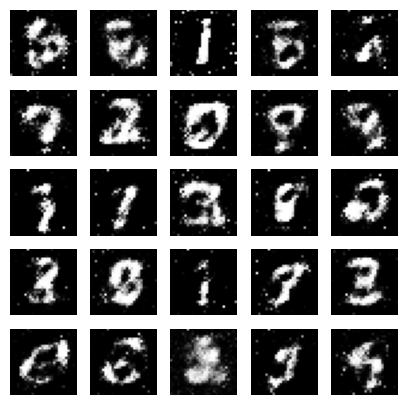

Epoch [5/50] Loss D: 0.6293, Loss G: 1.0575


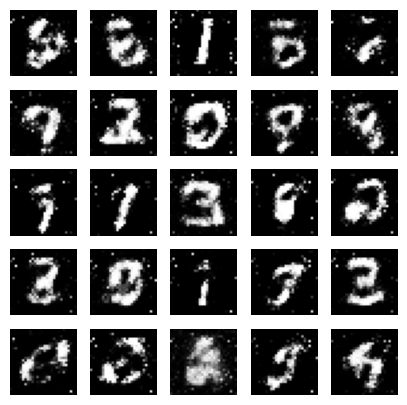

Epoch [6/50] Loss D: 0.7464, Loss G: 1.0871


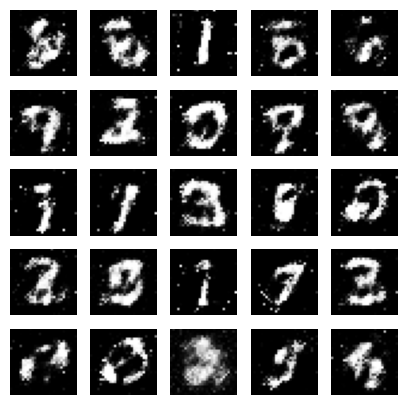

Epoch [7/50] Loss D: 0.6282, Loss G: 0.9050


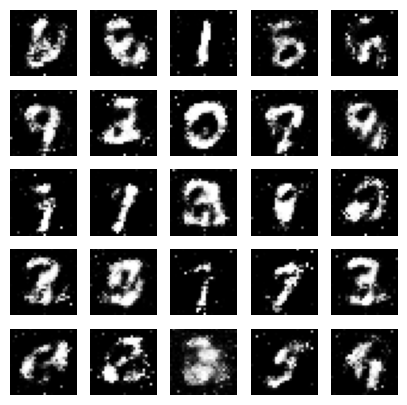

Epoch [8/50] Loss D: 0.5933, Loss G: 1.0318


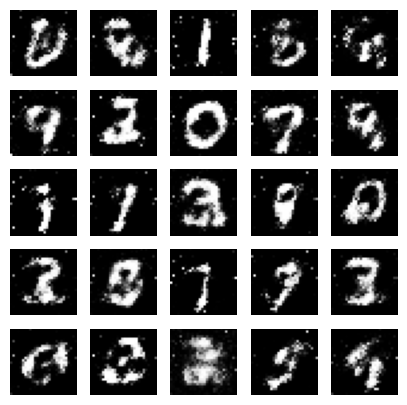

Epoch [9/50] Loss D: 0.6199, Loss G: 1.0195


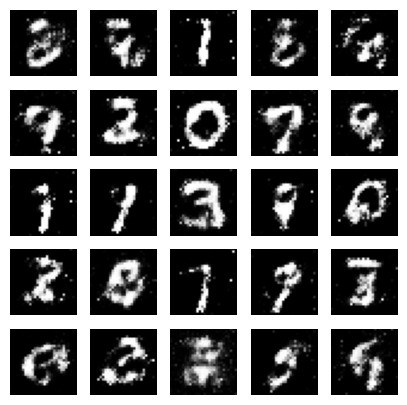

Epoch [10/50] Loss D: 0.6222, Loss G: 1.0627


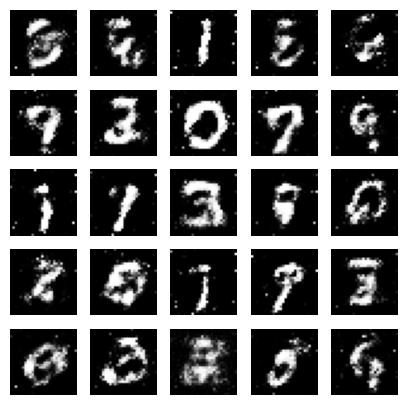

Epoch [11/50] Loss D: 0.6650, Loss G: 0.9704


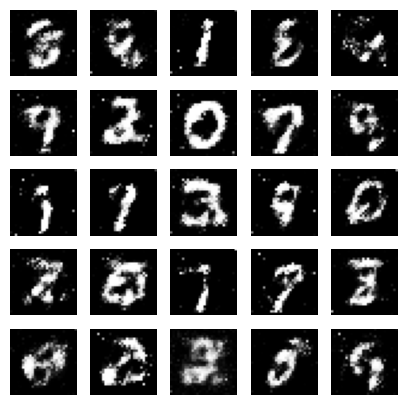

Epoch [12/50] Loss D: 0.6856, Loss G: 0.7942


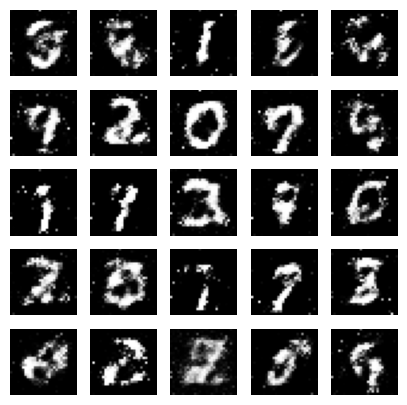

Epoch [13/50] Loss D: 0.9030, Loss G: 0.7345


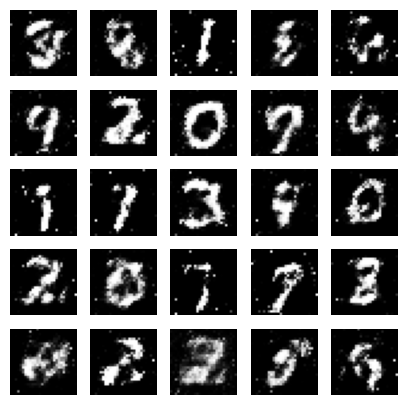

Epoch [14/50] Loss D: 0.7413, Loss G: 0.9426


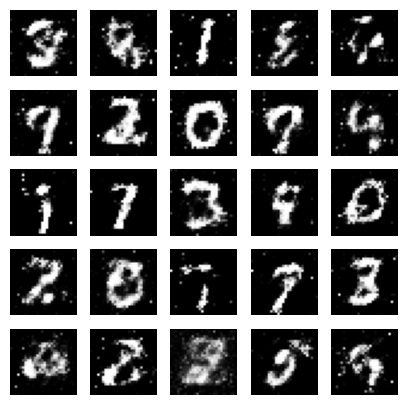

Epoch [15/50] Loss D: 0.5949, Loss G: 1.1140


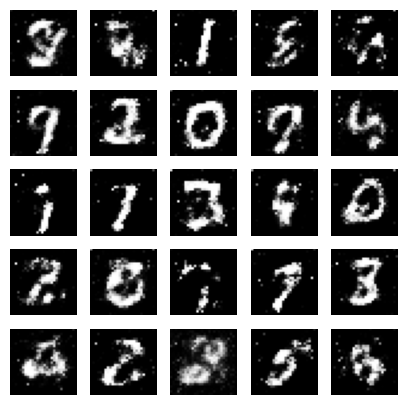

Epoch [16/50] Loss D: 0.6469, Loss G: 1.0192


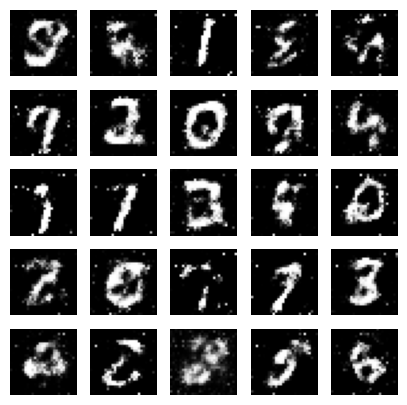

Epoch [17/50] Loss D: 0.6480, Loss G: 1.0205


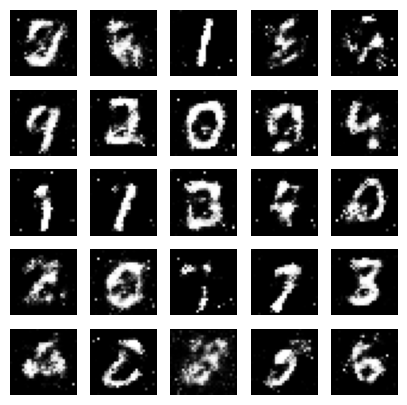

Epoch [18/50] Loss D: 0.6844, Loss G: 0.9129


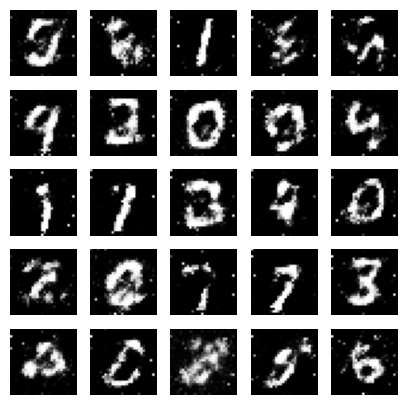

Epoch [19/50] Loss D: 0.5347, Loss G: 0.9762


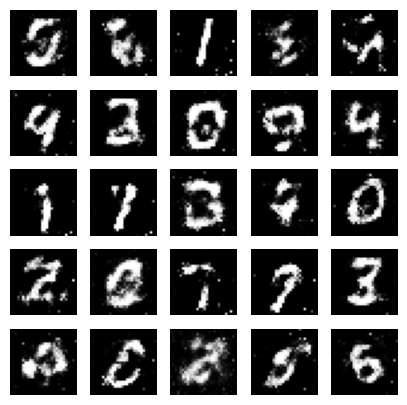

Epoch [20/50] Loss D: 0.5856, Loss G: 0.9402


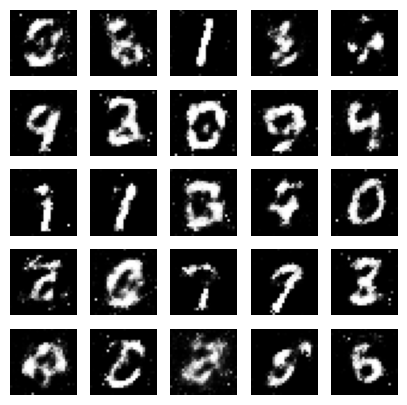

Epoch [21/50] Loss D: 0.6641, Loss G: 1.1111


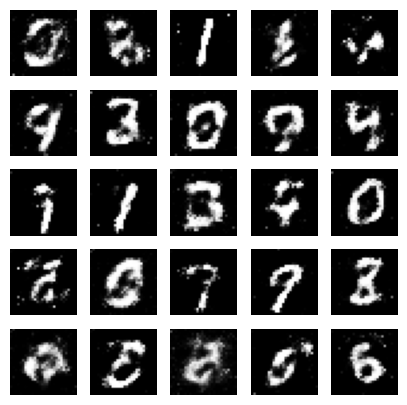

Epoch [22/50] Loss D: 0.6534, Loss G: 0.8235


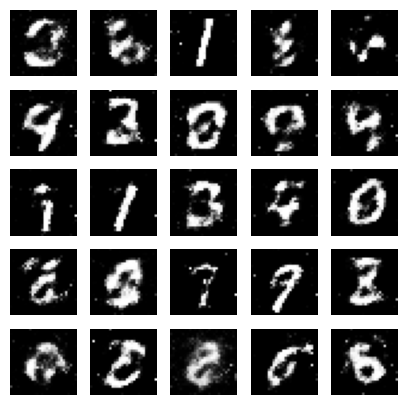

Epoch [23/50] Loss D: 0.7414, Loss G: 0.7264


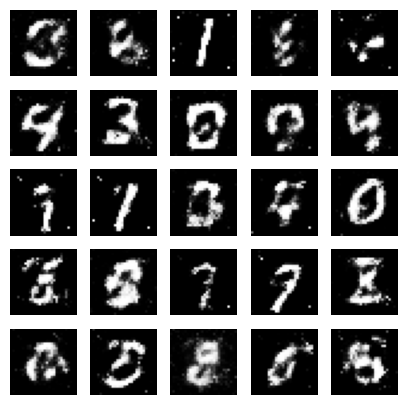

Epoch [24/50] Loss D: 0.7051, Loss G: 0.9216


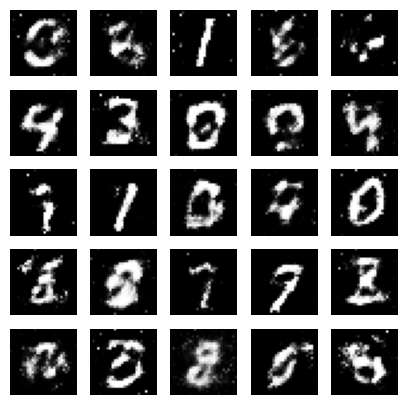

Epoch [25/50] Loss D: 0.6268, Loss G: 0.9307


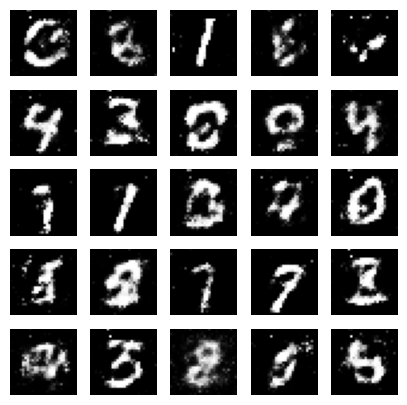

Epoch [26/50] Loss D: 0.6634, Loss G: 0.7670


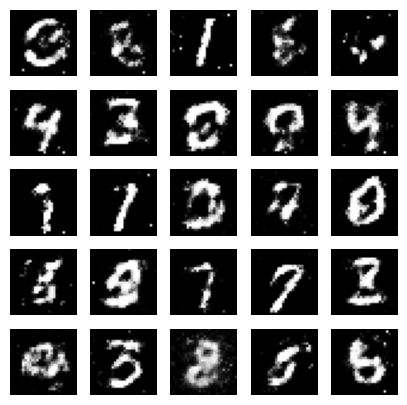

Epoch [27/50] Loss D: 0.6673, Loss G: 0.9903


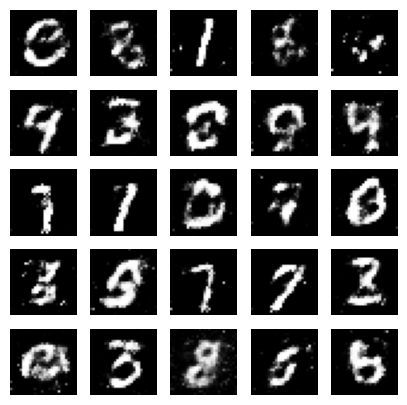

Epoch [28/50] Loss D: 0.6484, Loss G: 0.8591


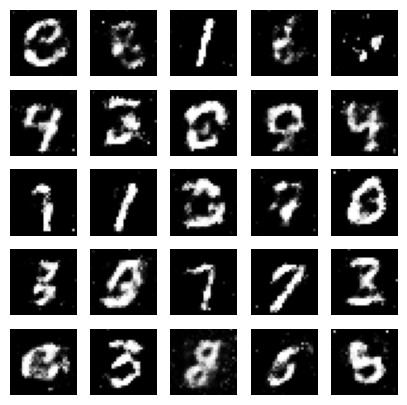

Epoch [29/50] Loss D: 0.6710, Loss G: 0.9394


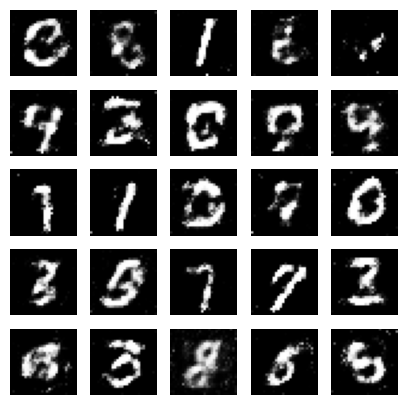

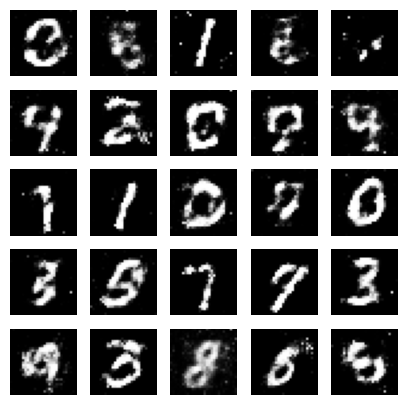

Epoch [31/50] Loss D: 0.6891, Loss G: 0.8780


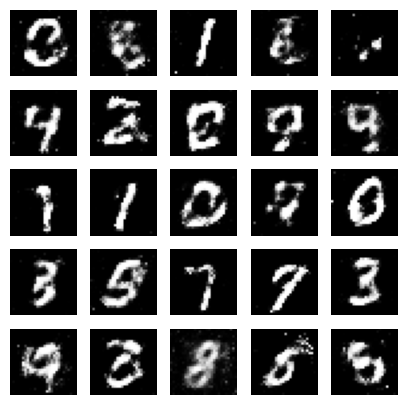

Epoch [32/50] Loss D: 0.5895, Loss G: 1.0111


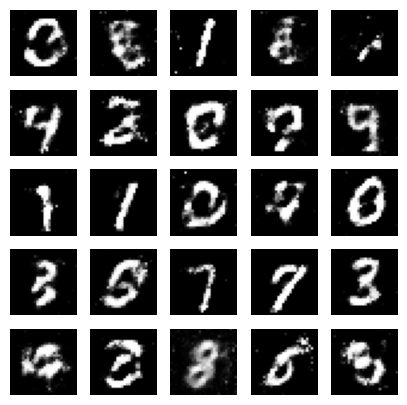

Epoch [33/50] Loss D: 0.6150, Loss G: 0.9405


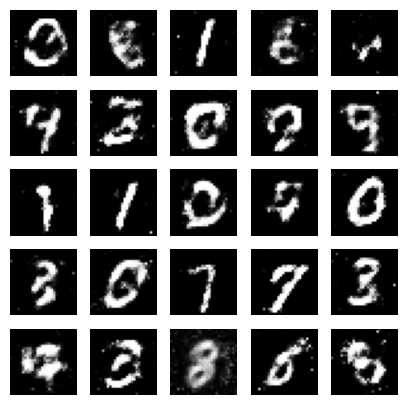

Epoch [34/50] Loss D: 0.6320, Loss G: 0.9108


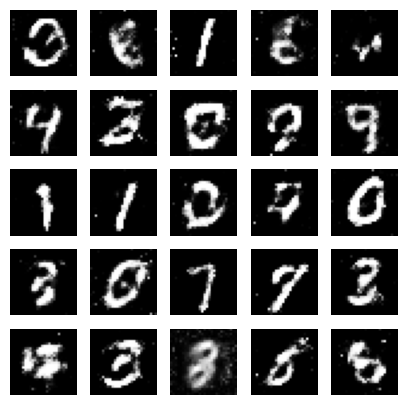

Epoch [35/50] Loss D: 0.6501, Loss G: 0.9533


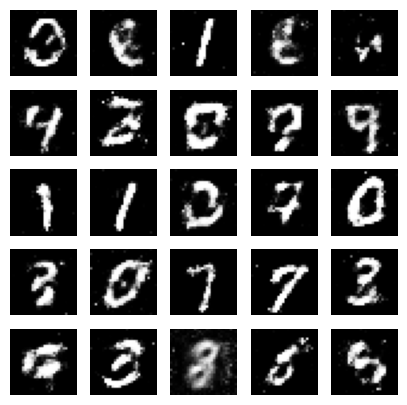

Epoch [36/50] Loss D: 0.7160, Loss G: 0.8800


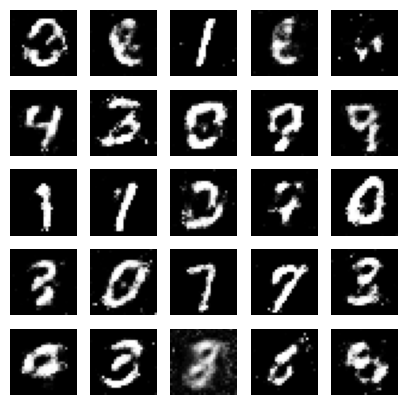

Epoch [37/50] Loss D: 0.7474, Loss G: 0.6587


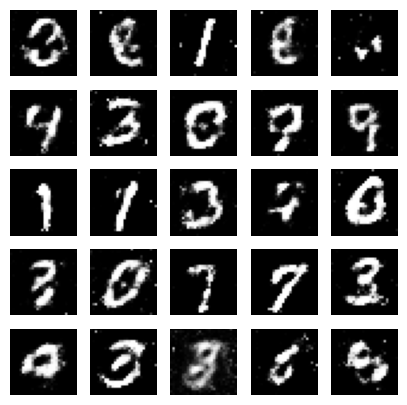

Epoch [38/50] Loss D: 0.5825, Loss G: 1.0065


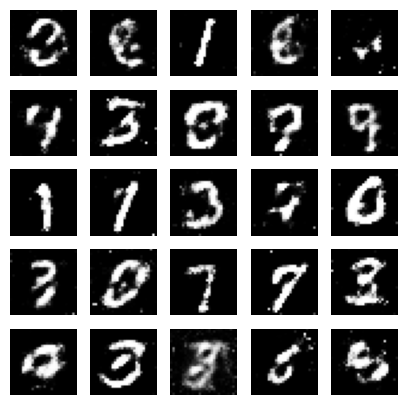

Epoch [39/50] Loss D: 0.6510, Loss G: 0.9160


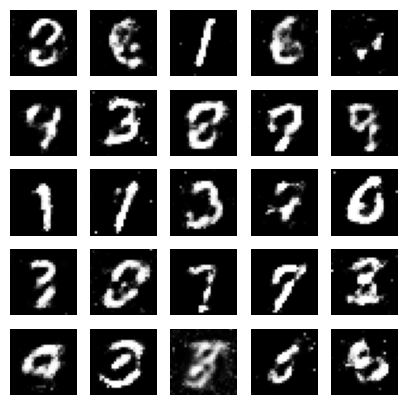

Epoch [40/50] Loss D: 0.6264, Loss G: 0.8916


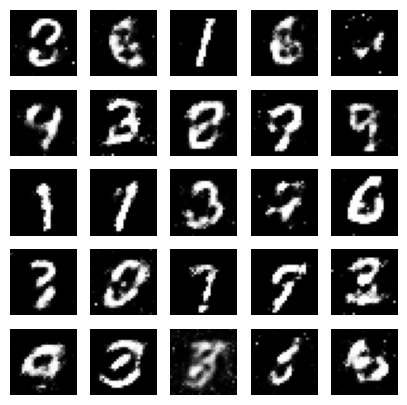

Epoch [41/50] Loss D: 0.6064, Loss G: 0.9677


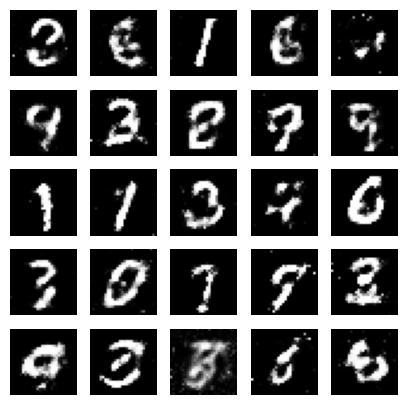

Epoch [42/50] Loss D: 0.6281, Loss G: 0.8584


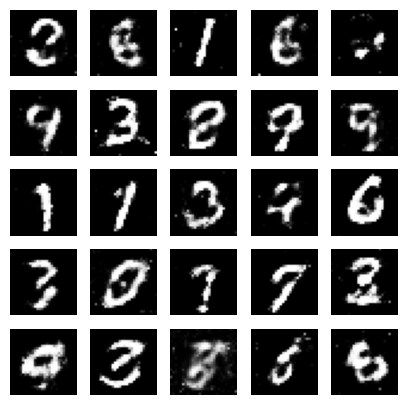

Epoch [43/50] Loss D: 0.5201, Loss G: 1.0751


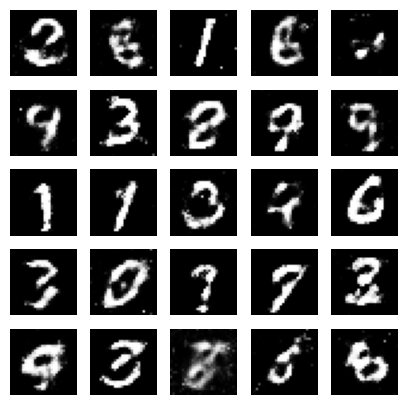

Epoch [44/50] Loss D: 0.6803, Loss G: 0.9578


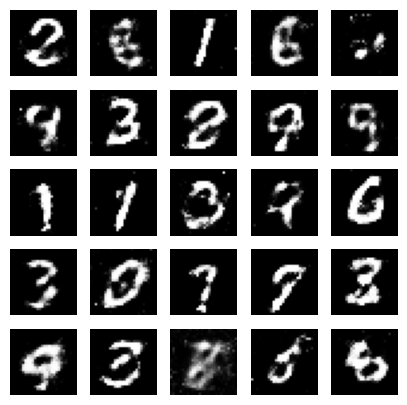

Epoch [45/50] Loss D: 0.6404, Loss G: 0.8808


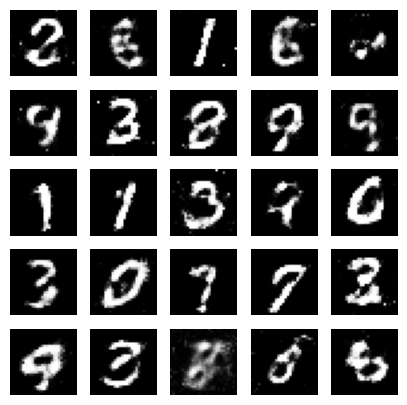

Epoch [46/50] Loss D: 0.6785, Loss G: 0.8417


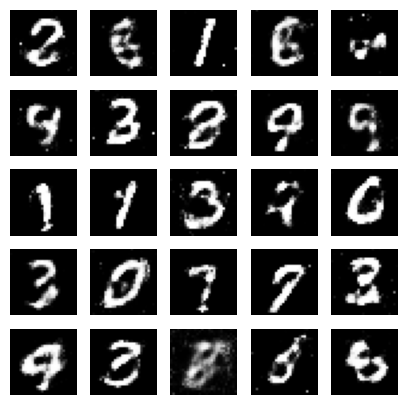

Epoch [47/50] Loss D: 0.5700, Loss G: 1.0142


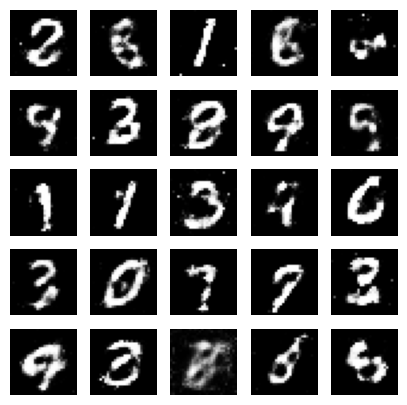

Epoch [48/50] Loss D: 0.6158, Loss G: 0.8605


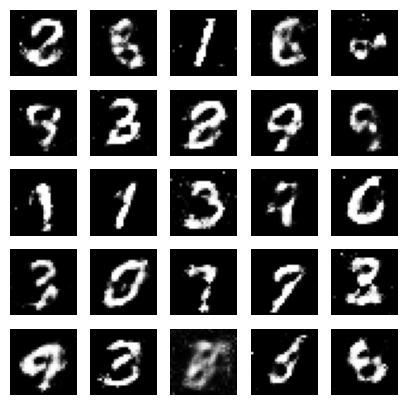

Epoch [49/50] Loss D: 0.6972, Loss G: 0.9154


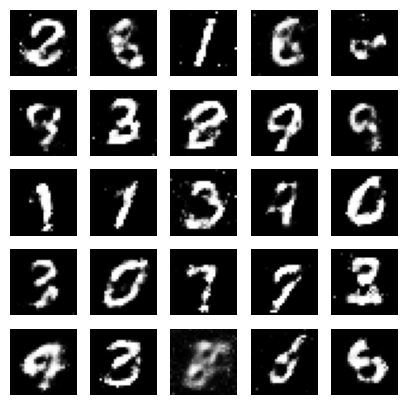

Epoch [50/50] Loss D: 0.5210, Loss G: 1.1288


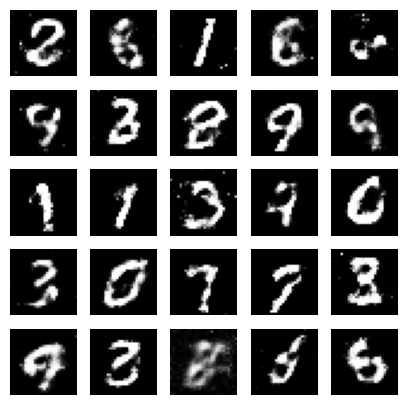

In [30]:
# TensorBoard writers
writer_fake = SummaryWriter(f"logs/fake")
writer_real = SummaryWriter(f"logs/real")
step = 0

# Training loop
for epoch in range(num_epochs):
    for batch_idx, (real, _) in enumerate(loader):
        real = real.view(-1, 784).to(device)
        batch_size = real.shape[0]

        # Train Discriminator
        noise = torch.randn(batch_size, z_dim).to(device)
        fake = gen(noise)
        disc_real = disc(real).view(-1)
        lossD_real = criterion(disc_real, torch.ones_like(disc_real))
        disc_fake = disc(fake.detach()).view(-1)
        lossD_fake = criterion(disc_fake, torch.zeros_like(disc_fake))
        lossD = (lossD_real + lossD_fake) / 2
        disc.zero_grad()
        lossD.backward()
        opt_disc.step()

        # Train Generator
        output = disc(fake).view(-1)
        lossG = criterion(output, torch.ones_like(output))
        gen.zero_grad()
        lossG.backward()
        opt_gen.step()

    print(f"Epoch [{epoch+1}/{num_epochs}] Loss D: {lossD:.4f}, Loss G: {lossG:.4f}")

    # Generate images at end of each epoch
    with torch.no_grad():
        fake_images = gen(fixed_noise).reshape(-1, 1, 28, 28).cpu()
        grid = torchvision.utils.make_grid(fake_images, normalize=True)
        writer_fake.add_image("Generated Images", grid, global_step=epoch)

        # Convert tensor images to numpy
        np_images = (fake_images.numpy() * 0.5) + 0.5
        fig, axes = plt.subplots(5, 5, figsize=(5, 5))
        for i, ax in enumerate(axes.flatten()):
            ax.imshow(np_images[i][0], cmap='gray')
            ax.axis('off')
        plt.show()


In [31]:
torch.save(gen.state_dict(), "gan_generator.pth")
files.download("gan_generator.pth")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [32]:

# Define Discriminator class
class Discriminator(nn.Module):
    def __init__(self, in_features):
        super().__init__()
        self.disc = nn.Sequential(
            nn.Linear(in_features, 256),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Linear(256, 128),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Linear(128, 1),
            nn.Sigmoid(),
        )
    def forward(self, x):
        return self.disc(x)

# Define Generator class
class Generator(nn.Module):
    def __init__(self, z_dim, img_dim):
        super().__init__()
        self.gen = nn.Sequential(
            nn.Linear(z_dim, 512),
            nn.ReLU(),
            nn.BatchNorm1d(512),
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.BatchNorm1d(256),
            nn.Linear(256, 128),
            nn.ReLU(),
            nn.BatchNorm1d(128),
            nn.Linear(128, img_dim),
            nn.Tanh(),
        )
    def forward(self, x):
        return self.gen(x)

# Hyperparameters
device = "cuda" if torch.cuda.is_available() else "cpu"
lr = 2e-4
z_dim = 100  # Increased latent vector size
image_dim = 28 * 28 * 1  # 784
batch_size = 64  # Increased batch size
num_epochs = 50

# Initialize models
disc = Discriminator(image_dim).to(device)
gen = Generator(z_dim, image_dim).to(device)
fixed_noise = torch.randn((batch_size, z_dim)).to(device)

# Data transformations and loading
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataset = datasets.MNIST(root="./data", transform=transform, download=True)
loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

# Optimizers and loss function
opt_disc = optim.Adam(disc.parameters(), lr=lr, betas=(0.5, 0.999))
opt_gen = optim.Adam(gen.parameters(), lr=lr, betas=(0.5, 0.999))
criterion = nn.BCELoss()


Epoch [1/50] Loss D: 0.1499, Loss G: 3.0818


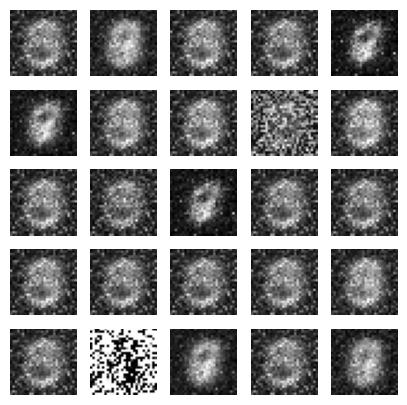

Epoch [2/50] Loss D: 0.3413, Loss G: 2.5084


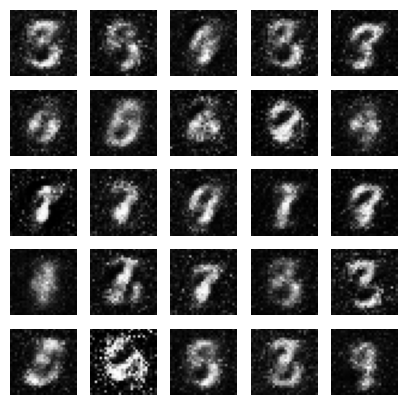

Epoch [3/50] Loss D: 0.3534, Loss G: 1.8367


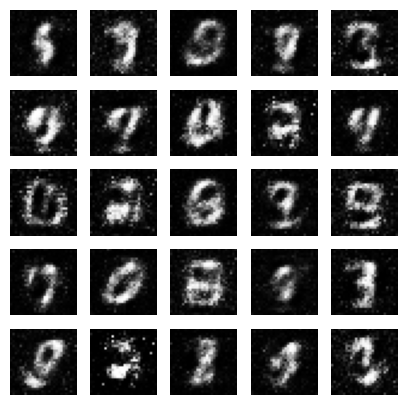

Epoch [4/50] Loss D: 0.4312, Loss G: 1.6448


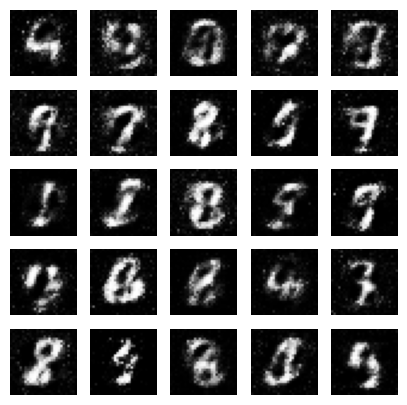

Epoch [5/50] Loss D: 0.6463, Loss G: 2.0203


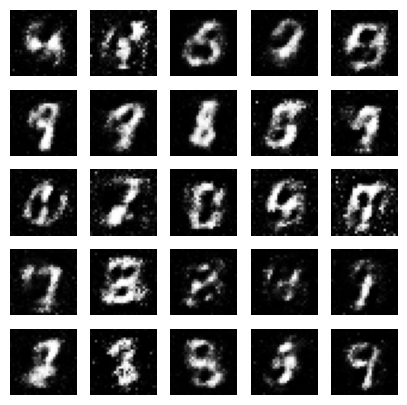

Epoch [6/50] Loss D: 0.6074, Loss G: 0.7162


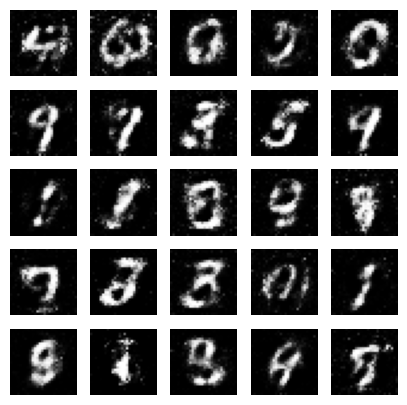

Epoch [7/50] Loss D: 0.6145, Loss G: 1.0807


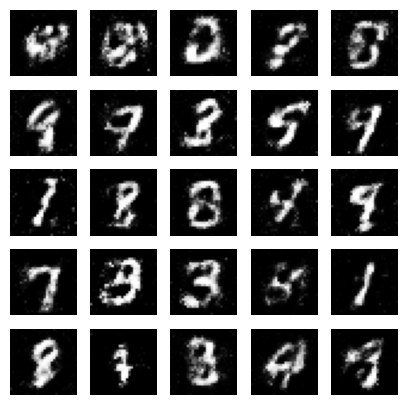

Epoch [8/50] Loss D: 0.5733, Loss G: 0.8993


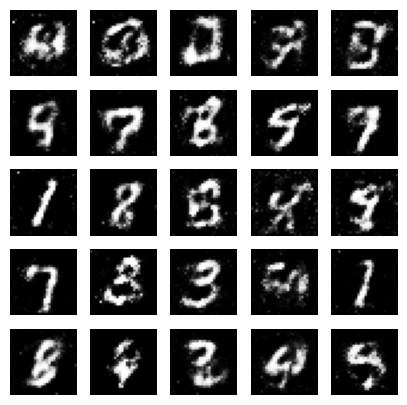

Epoch [9/50] Loss D: 0.5998, Loss G: 0.7218


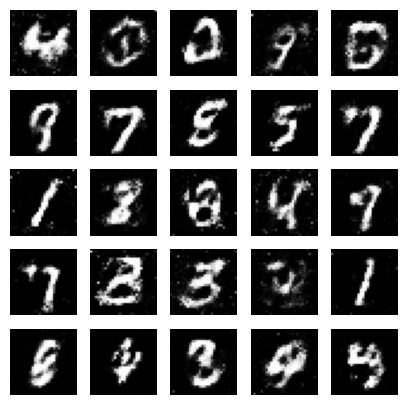

Epoch [10/50] Loss D: 0.6790, Loss G: 0.6118


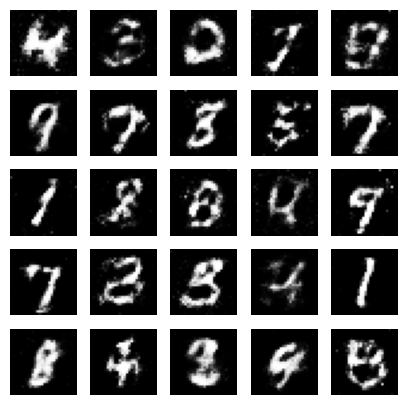

Epoch [11/50] Loss D: 0.6381, Loss G: 0.7480


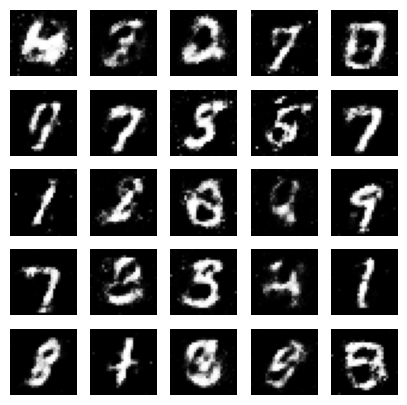

Epoch [12/50] Loss D: 0.6891, Loss G: 0.7870


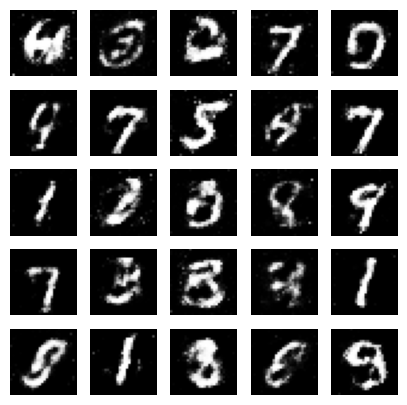

Epoch [13/50] Loss D: 0.6586, Loss G: 0.8962


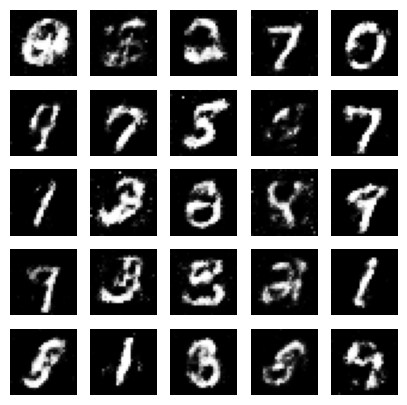

Epoch [14/50] Loss D: 0.6207, Loss G: 0.9018


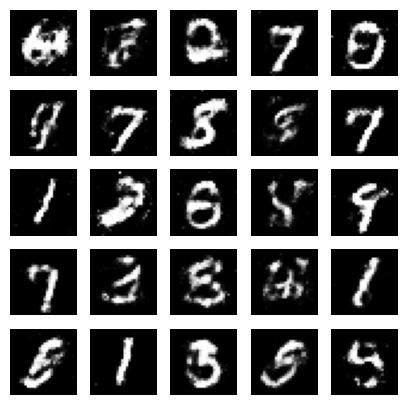

Epoch [15/50] Loss D: 0.6255, Loss G: 0.9284


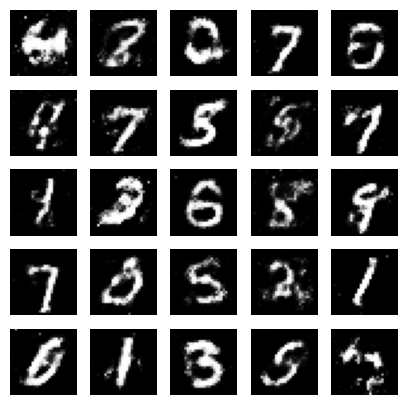

Epoch [16/50] Loss D: 0.6685, Loss G: 0.7943


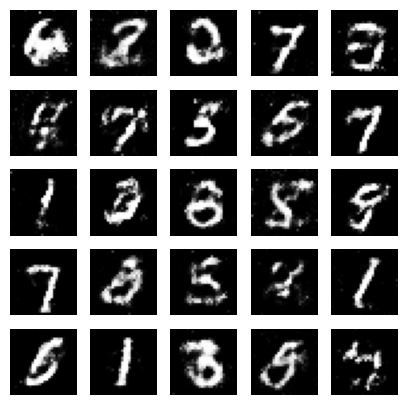

Epoch [17/50] Loss D: 0.5512, Loss G: 0.8636


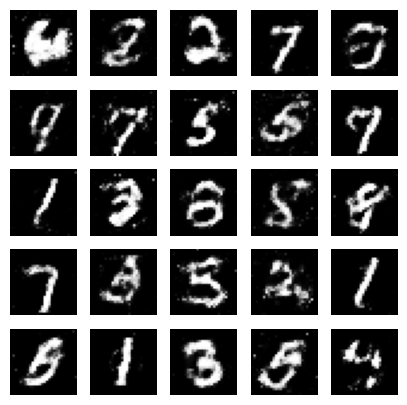

Epoch [18/50] Loss D: 0.6618, Loss G: 0.7056


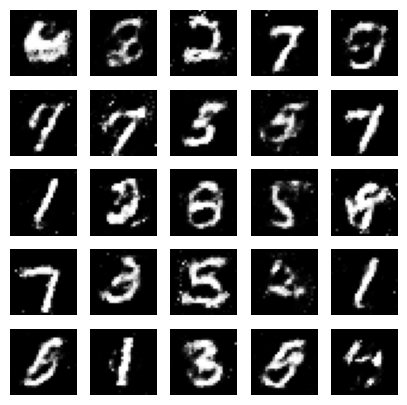

Epoch [19/50] Loss D: 0.6309, Loss G: 0.7851


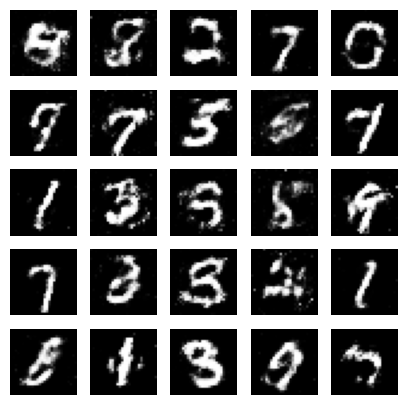

Epoch [20/50] Loss D: 0.5671, Loss G: 0.7768


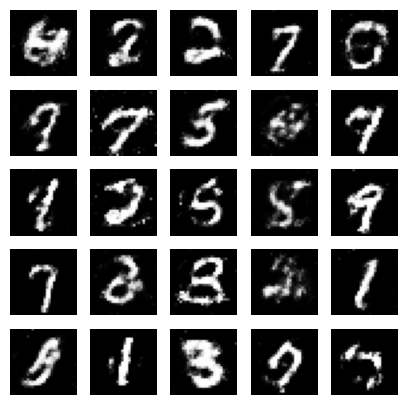

Epoch [21/50] Loss D: 0.6376, Loss G: 0.7384


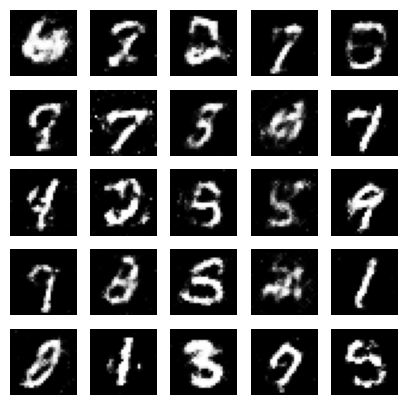

Epoch [22/50] Loss D: 0.5859, Loss G: 0.6427


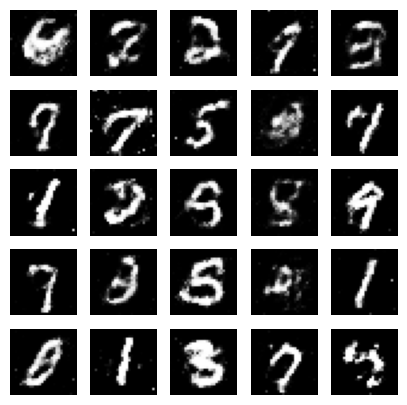

Epoch [23/50] Loss D: 0.7316, Loss G: 0.7770


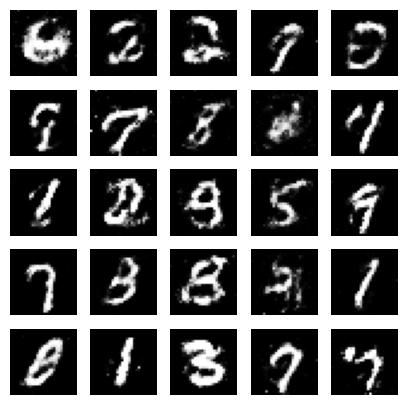

Epoch [24/50] Loss D: 0.6438, Loss G: 0.9272


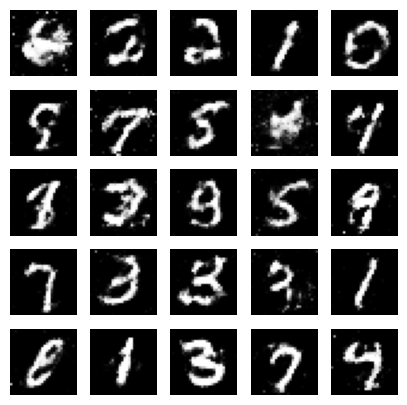

Epoch [25/50] Loss D: 0.7045, Loss G: 0.8419


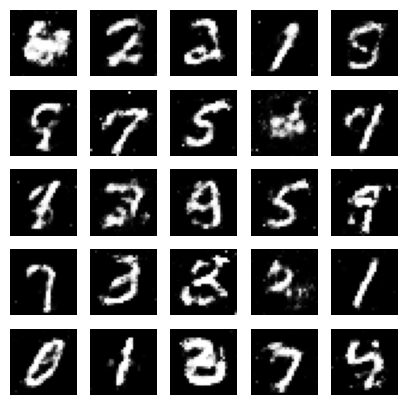

Epoch [26/50] Loss D: 0.6505, Loss G: 1.0144


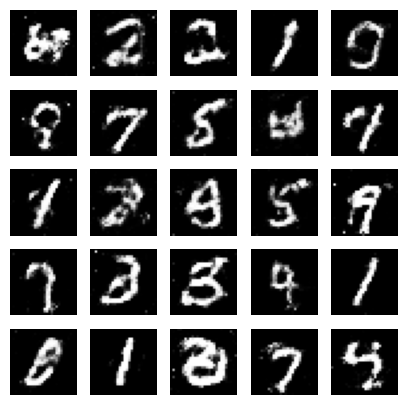

Epoch [27/50] Loss D: 0.6363, Loss G: 0.9808


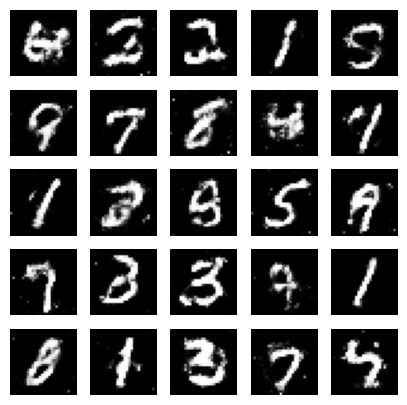

Epoch [28/50] Loss D: 0.6504, Loss G: 0.7839


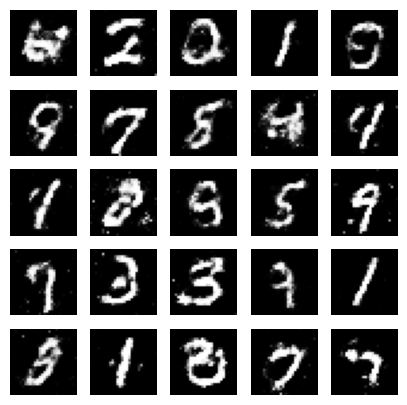

Epoch [29/50] Loss D: 0.6580, Loss G: 0.7502


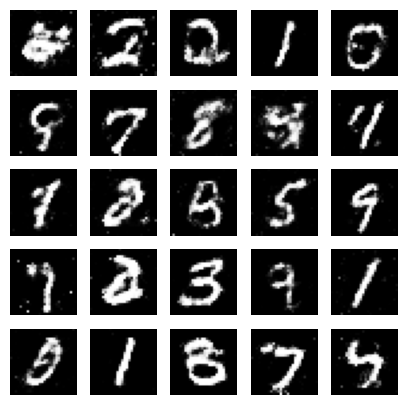

Epoch [30/50] Loss D: 0.6824, Loss G: 0.8966


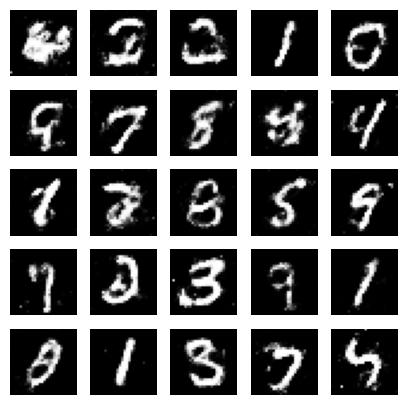

Epoch [31/50] Loss D: 0.6663, Loss G: 1.0387


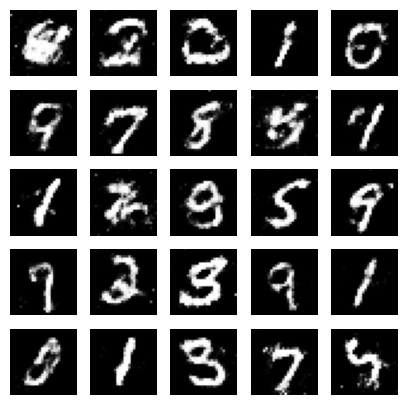

Epoch [32/50] Loss D: 0.6585, Loss G: 0.9750


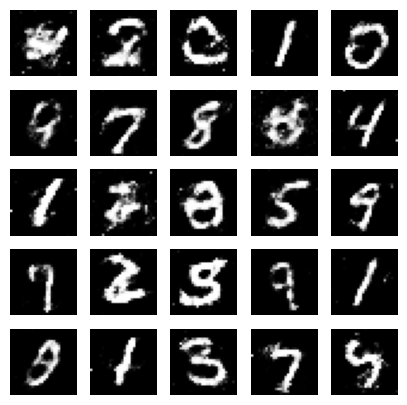

Epoch [33/50] Loss D: 0.6458, Loss G: 0.9329


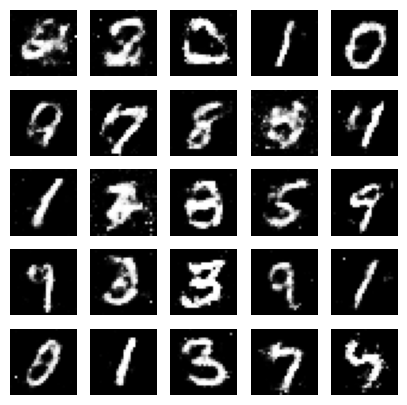

Epoch [34/50] Loss D: 0.6610, Loss G: 0.8770


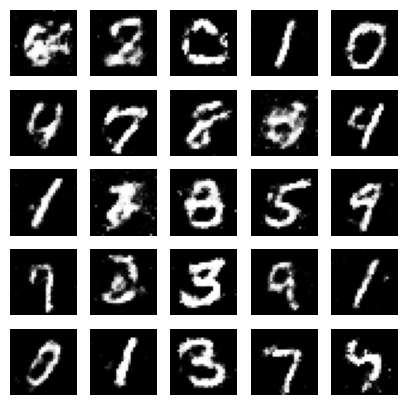

Epoch [35/50] Loss D: 0.6558, Loss G: 0.8205


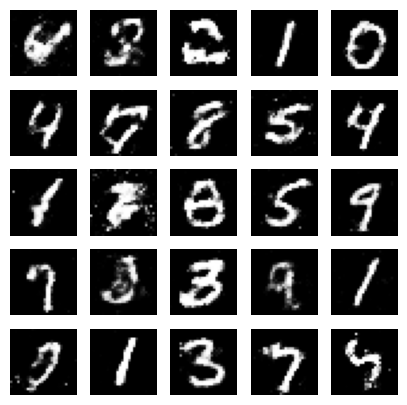

Epoch [36/50] Loss D: 0.7021, Loss G: 0.9014


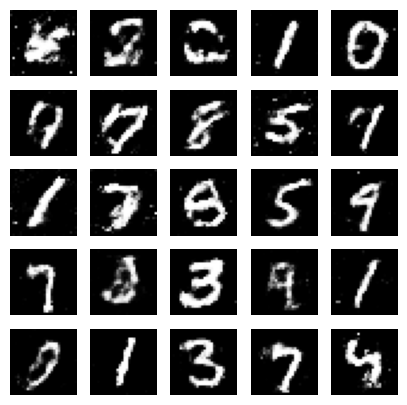

Epoch [37/50] Loss D: 0.6928, Loss G: 0.7880


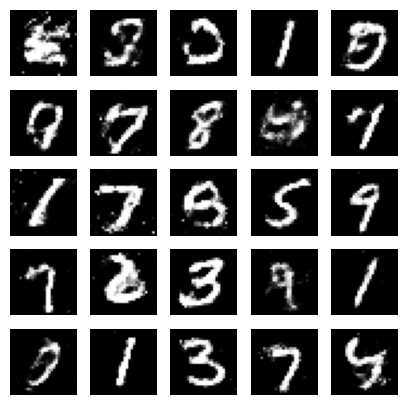

Epoch [38/50] Loss D: 0.6291, Loss G: 0.9036


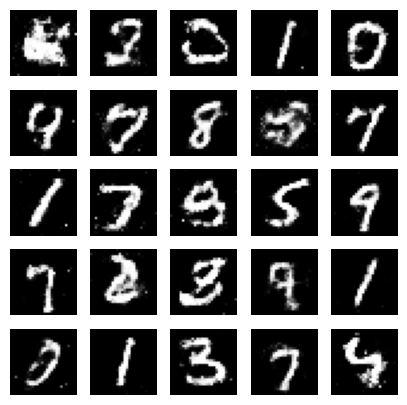

Epoch [39/50] Loss D: 0.6772, Loss G: 0.8610


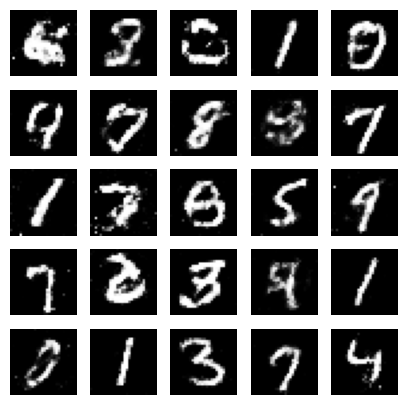

Epoch [40/50] Loss D: 0.6595, Loss G: 1.0310


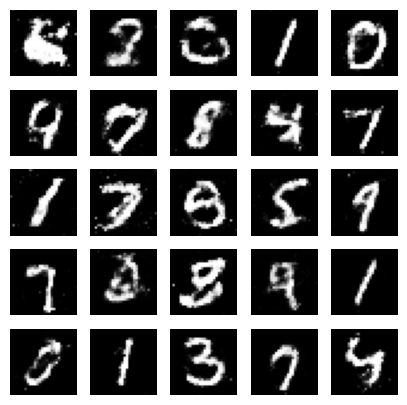

Epoch [41/50] Loss D: 0.6182, Loss G: 0.7723


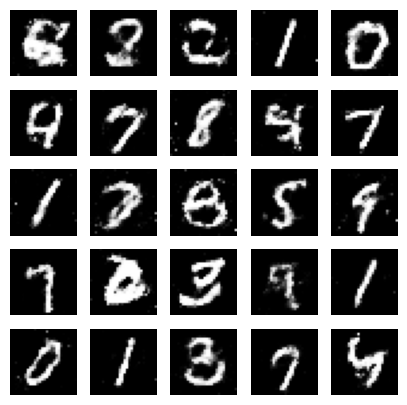

Epoch [42/50] Loss D: 0.6542, Loss G: 0.8001


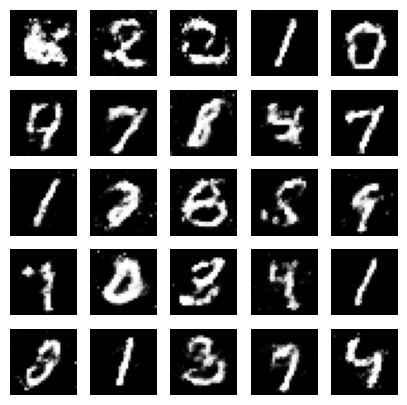

Epoch [43/50] Loss D: 0.6624, Loss G: 0.9369


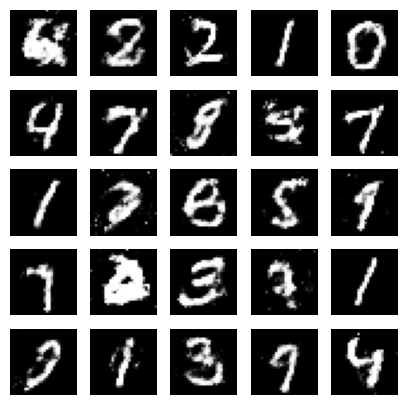

Epoch [44/50] Loss D: 0.6295, Loss G: 0.7723


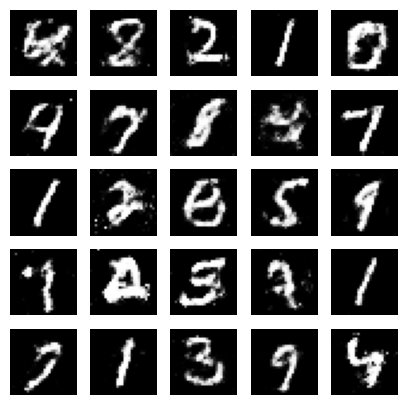

Epoch [45/50] Loss D: 0.6128, Loss G: 0.7457


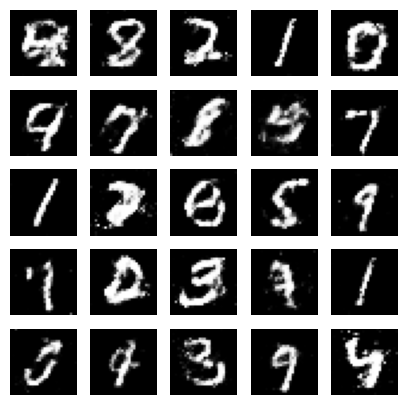

Epoch [46/50] Loss D: 0.6891, Loss G: 0.8518


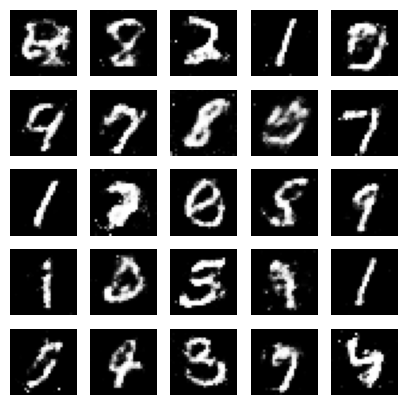

Epoch [47/50] Loss D: 0.6941, Loss G: 0.8628


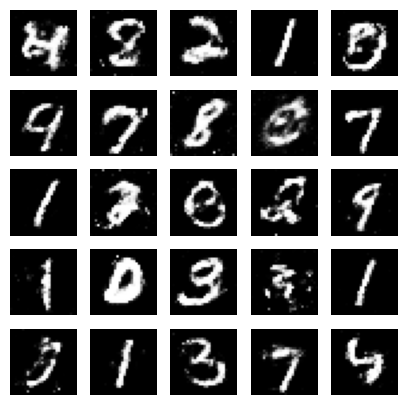

Epoch [48/50] Loss D: 0.6809, Loss G: 0.7359


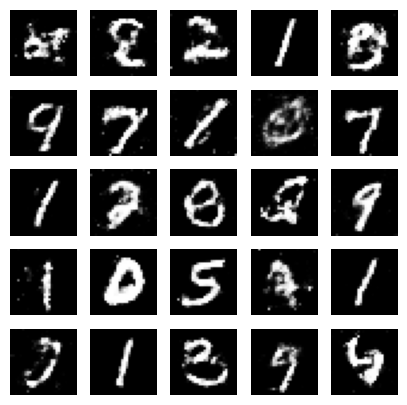

Epoch [49/50] Loss D: 0.6895, Loss G: 0.7567


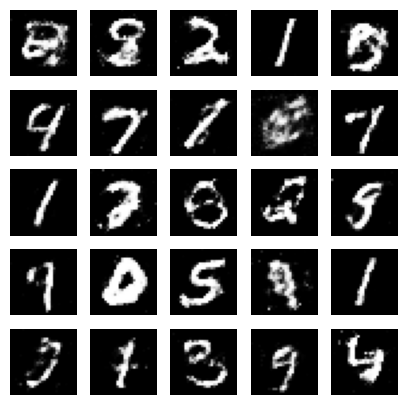

Epoch [50/50] Loss D: 0.6087, Loss G: 0.7820


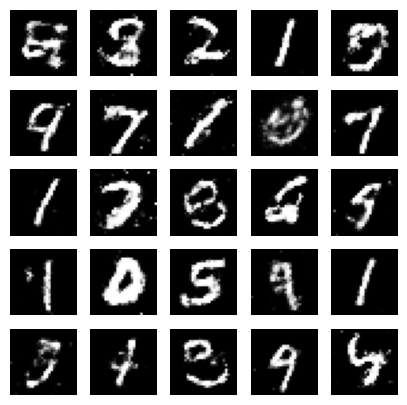

In [33]:

# TensorBoard writers
writer_fake = SummaryWriter(f"logs/fake")
writer_real = SummaryWriter(f"logs/real")
step = 0

# Training loop
for epoch in range(num_epochs):
    for batch_idx, (real, _) in enumerate(loader):
        real = real.view(-1, 784).to(device)
        batch_size = real.shape[0]

        # Train Discriminator
        noise = torch.randn(batch_size, z_dim).to(device)
        fake = gen(noise)
        disc_real = disc(real).view(-1)
        lossD_real = criterion(disc_real, torch.ones_like(disc_real))
        disc_fake = disc(fake.detach()).view(-1)
        lossD_fake = criterion(disc_fake, torch.zeros_like(disc_fake))
        lossD = (lossD_real + lossD_fake) / 2
        disc.zero_grad()
        lossD.backward()
        opt_disc.step()

        # Train Generator
        output = disc(fake).view(-1)
        lossG = criterion(output, torch.ones_like(output))
        gen.zero_grad()
        lossG.backward()
        opt_gen.step()

    print(f"Epoch [{epoch+1}/{num_epochs}] Loss D: {lossD:.4f}, Loss G: {lossG:.4f}")

    # Generate images at end of each epoch
    with torch.no_grad():
        fake_images = gen(fixed_noise).reshape(-1, 1, 28, 28).cpu()
        grid = torchvision.utils.make_grid(fake_images, normalize=True)
        writer_fake.add_image("Generated Images", grid, global_step=epoch)

        # Convert tensor images to numpy
        np_images = (fake_images.numpy() * 0.5) + 0.5
        fig, axes = plt.subplots(5, 5, figsize=(5, 5))
        for i, ax in enumerate(axes.flatten()):
            ax.imshow(np_images[i][0], cmap='gray')
            ax.axis('off')
        plt.show()


In [34]:

# Save model
torch.save(gen.state_dict(), "gan_generator.pth")
files.download("gan_generator.pth")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>